<a href="https://colab.research.google.com/github/MuhsinaPP/Deep-Learning/blob/main/LungDisease.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#importing libraries
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.image import imread
import random

import cv2
import pathlib
from glob import glob
from os import listdir

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.preprocessing import LabelBinarizer

from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import img_to_array, array_to_img
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation,Flatten, Dropout, Dense
from tensorflow.keras.losses import SparseCategoricalCrossentropy,BinaryCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import callbacks

In [ ]:
file_path = pathlib.Path('C:/Users/abelb/Downloads/Lung Disease/Lung Disease')

Lung_Opacity_list = list(file_path.glob("Lung_Opacity*"))
Normal_list = list(file_path.glob('Normal*'))
Viral_Pneumonia_list = list(file_path.glob('Viral Pneumonia/*'))

listdir('C:/Users/abelb/Downloads/Lung Disease/Lung Disease/Lung_Opacity')

listdir('C:/Users/abelb/Downloads/Lung Disease/Lung Disease/Normal')

listdir('C:/Users/abelb/Downloads/Lung Disease/Lung Disease/Viral Pneumonia')

['1.jpg',
 '10.jpg',
 '100.jpg',
 '1000.jpg',
 '1001.jpg',
 '1002.jpg',
 '1003.jpg',
 '1004.jpg',
 '1005.jpg',
 '1006.jpg',
 '1007.jpg',
 '1008.jpg',
 '1009.jpg',
 '101.jpg',
 '1010.jpg',
 '1011.jpg',
 '1012.jpg',
 '1013.jpg',
 '1014.jpg',
 '1015.jpg',
 '1016.jpg',
 '1017.jpg',
 '1018.jpg',
 '1019.jpg',
 '102.jpg',
 '1020.jpg',
 '1021.jpg',
 '1022.jpg',
 '1023.jpg',
 '1024.jpg',
 '1025.jpg',
 '1026.jpg',
 '1027.jpg',
 '1028.jpg',
 '1029.jpg',
 '103.jpg',
 '1030.jpg',
 '1031.jpg',
 '1032.jpg',
 '1033.jpg',
 '1034.jpg',
 '1035.jpg',
 '1036.jpg',
 '1037.jpg',
 '1038.jpg',
 '1039.jpg',
 '104.jpg',
 '1040.jpg',
 '1041.jpg',
 '1042.jpg',
 '1043.jpg',
 '1044.jpg',
 '1045.jpg',
 '1046.jpg',
 '1047.jpg',
 '1048.jpg',
 '1049.jpg',
 '105.jpg',
 '1050.jpg',
 '1051.jpg',
 '1052.jpg',
 '1053.jpg',
 '1054.jpg',
 '1055.jpg',
 '1056.jpg',
 '1057.jpg',
 '1058.jpg',
 '1059.jpg',
 '106.jpg',
 '1060.jpg',
 '1061.jpg',
 '1062.jpg',
 '1063.jpg',
 '1064.jpg',
 '1065.jpg',
 '1066.jpg',
 '1067.jpg',
 '1068.jpg'

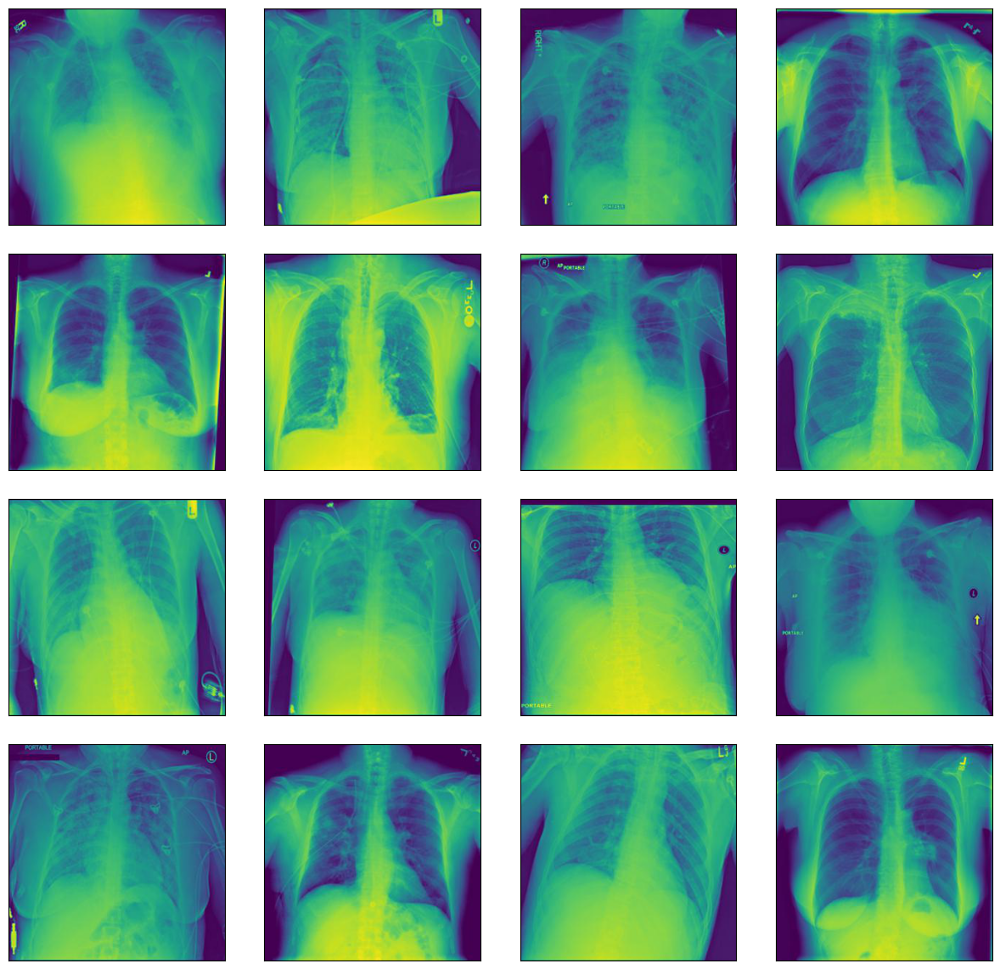

In [ ]:
#Visualizing the Lung_Opacity

plt.figure(figsize=(12,12))

for i in range(1,17):
    path='C:/Users/abelb/Downloads/Lung Disease/Lung Disease/Lung_Opacity'
    plt.subplot(4,4,i)
    plt.tight_layout()
    ramd_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(ramd_img)

    plt.xticks([])
    plt.yticks([])

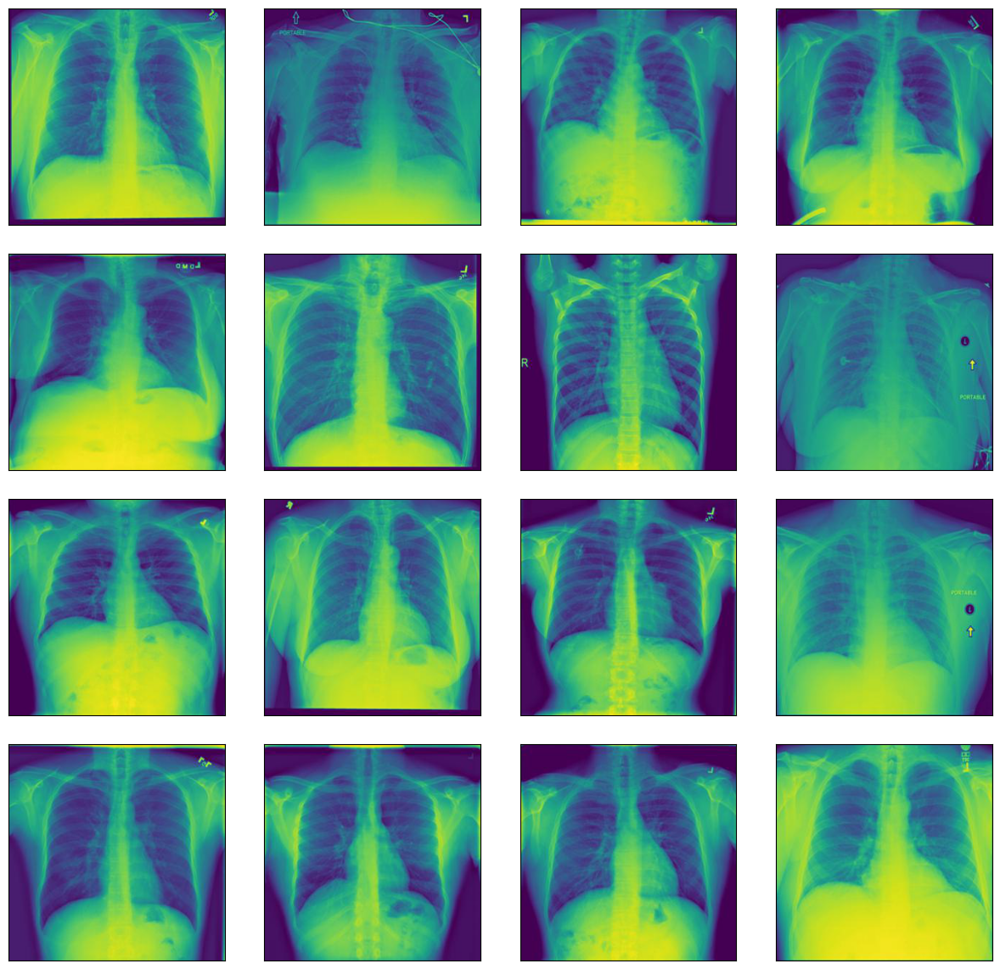

In [ ]:
#Visualizing the Normal

plt.figure(figsize=(12,12))

for i in range(1,17):
    path='C:/Users/abelb/Downloads/Lung Disease/Lung Disease/Normal'
    plt.subplot(4,4,i)
    plt.tight_layout()
    ramd_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(ramd_img)

    plt.xticks([])
    plt.yticks([])

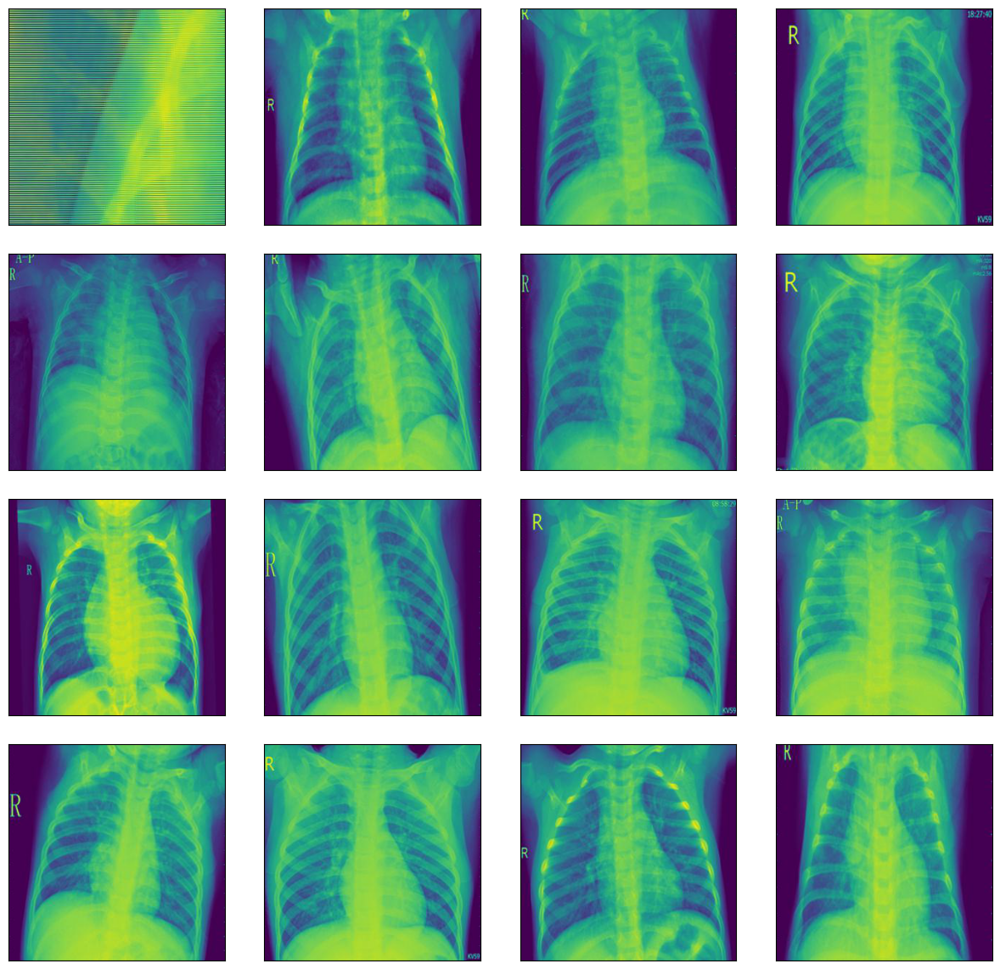

In [ ]:
#Visualizing the Viral Pneumonia

plt.figure(figsize=(12,12))

for i in range(1,17):
    path='C:/Users/abelb/Downloads/Lung Disease/Lung Disease/Viral Pneumonia'
    plt.subplot(4,4,i)
    plt.tight_layout()
    ramd_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(ramd_img)

    plt.xticks([])
    plt.yticks([])

In [ ]:
#Data Pre-processing

root_dir=listdir(file_path)
image_list,label_list=[],[]

root_dir

for directory in root_dir:
    for files in listdir(f"{file_path}/{directory}"):
        image_path=f"{file_path}/{directory}/{files}"

        image=cv2.imread(image_path)
        image=img_to_array(image)

        image_list.append(image)
        label_list.append(directory)

print(len(image_list))

print(image_list[0])

print(label_list[0:4])

3475
[[[ 97.  15.  68.]
  [ 98.  16.  69.]
  [ 98.  16.  69.]
  ...
  [ 98.  19.  63.]
  [ 98.  19.  62.]
  [ 98.  19.  62.]]

 [[ 97.  15.  68.]
  [ 98.  16.  69.]
  [ 98.  16.  69.]
  ...
  [ 98.  18.  65.]
  [ 98.  19.  62.]
  [ 98.  19.  62.]]

 [[ 98.  16.  69.]
  [ 98.  16.  69.]
  [ 99.  17.  70.]
  ...
  [ 99.  18.  67.]
  [ 99.  20.  64.]
  [ 99.  20.  64.]]

 ...

 [[130. 154.  30.]
  [139. 163.  37.]
  [142. 172.  43.]
  ...
  [125.  44.  77.]
  [108.  27.  72.]
  [ 94.  11.  66.]]

 [[129. 148.  27.]
  [136. 157.  34.]
  [140. 164.  38.]
  ...
  [125.  44.  77.]
  [108.  27.  72.]
  [ 94.  11.  66.]]

 [[129. 143.  25.]
  [133. 149.  31.]
  [136. 155.  34.]
  ...
  [125.  45.  76.]
  [108.  28.  71.]
  [ 94.  12.  65.]]]
['Lung_Opacity', 'Lung_Opacity', 'Lung_Opacity', 'Lung_Opacity']


0              
Normal             1250
Lung_Opacity       1125
Viral Pneumonia    1100
Name: count, dtype: int64
3
(299, 299, 3)
(3475,)


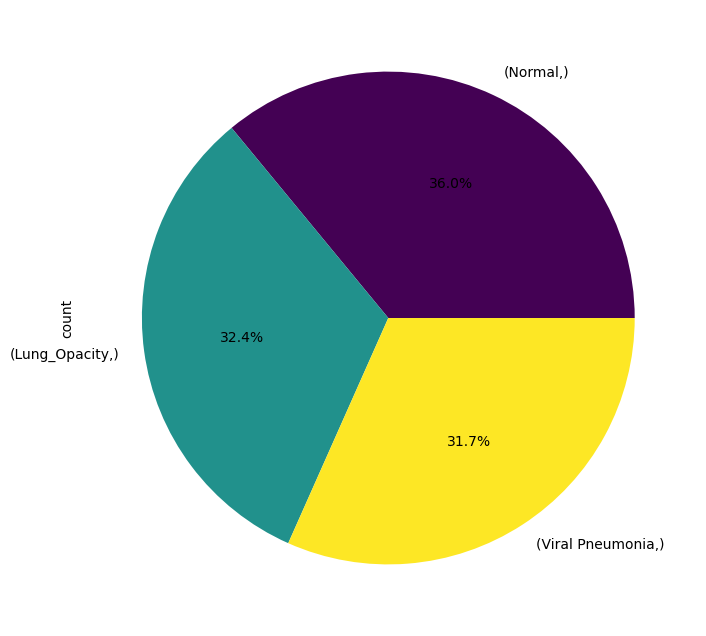

In [ ]:
label_counts=pd.DataFrame(label_list).value_counts()
print(label_counts)

plt.figure(figsize=(10,8))
label_counts.plot(kind='pie',autopct="%.1f%%", cmap='viridis')

num_classes=len(label_counts)
print(num_classes)

print(image_list[0].shape)

label_list=np.array(label_list)
print(label_list.shape)

In [ ]:
X_train,X_test,Y_train,Y_test=train_test_split(image_list, label_list, test_size=0.3, random_state=1)

print(f"Number of Training datasets: {len(X_train)}\nNumber of Testing datasets: {len(X_test)}")

print(X_train)

Number of Training datasets: 2432
Number of Testing datasets: 1043
[array([[[92.,  4., 74.],
        [92.,  4., 74.],
        [92.,  5., 73.],
        ...,
        [91., 11., 64.],
        [91., 11., 64.],
        [91., 11., 64.]],

       [[96.,  9., 77.],
        [96.,  9., 75.],
        [96.,  9., 75.],
        ...,
        [93., 12., 67.],
        [93., 13., 66.],
        [93., 13., 66.]],

       [[98., 13., 75.],
        [98., 13., 75.],
        [98., 13., 75.],
        ...,
        [97., 13., 71.],
        [97., 14., 69.],
        [97., 14., 69.]],

       ...,

       [[83.,  0., 68.],
        [81.,  1., 68.],
        [83.,  0., 68.],
        ...,
        [87.,  3., 62.],
        [85.,  3., 62.],
        [83.,  3., 62.]],

       [[80.,  1., 68.],
        [78.,  1., 68.],
        [80.,  1., 68.],
        ...,
        [87.,  2., 64.],
        [85.,  3., 62.],
        [83.,  3., 62.]],

       [[78.,  2., 66.],
        [76.,  3., 65.],
        [78.,  3., 65.],
        ...,
      

In [ ]:
#Normalization

X_train=np.array(X_train, dtype=np.float16)/ 255.0
X_test=np.array(X_test, dtype=np.float16)/ 255.0

X_train=X_train.reshape(-1, 299, 299, 3)
X_test=X_test.reshape(-1,299, 299, 3)

print(X_train[0])

[[[0.3608   0.01569  0.2903  ]
  [0.3608   0.01569  0.2903  ]
  [0.3608   0.0196   0.2864  ]
  ...
  [0.357    0.04315  0.251   ]
  [0.357    0.04315  0.251   ]
  [0.357    0.04315  0.251   ]]

 [[0.3765   0.0353   0.302   ]
  [0.3765   0.0353   0.2942  ]
  [0.3765   0.0353   0.2942  ]
  ...
  [0.3647   0.04706  0.2627  ]
  [0.3647   0.051    0.2588  ]
  [0.3647   0.051    0.2588  ]]

 [[0.3843   0.051    0.2942  ]
  [0.3843   0.051    0.2942  ]
  [0.3843   0.051    0.2942  ]
  ...
  [0.3804   0.051    0.2783  ]
  [0.3804   0.0549   0.2705  ]
  [0.3804   0.0549   0.2705  ]]

 ...

 [[0.3254   0.       0.2666  ]
  [0.3176   0.00392  0.2666  ]
  [0.3254   0.       0.2666  ]
  ...
  [0.341    0.011765 0.2432  ]
  [0.3333   0.011765 0.2432  ]
  [0.3254   0.011765 0.2432  ]]

 [[0.3137   0.00392  0.2666  ]
  [0.306    0.00392  0.2666  ]
  [0.3137   0.00392  0.2666  ]
  ...
  [0.341    0.00784  0.251   ]
  [0.3333   0.011765 0.2432  ]
  [0.3254   0.011765 0.2432  ]]

 [[0.306    0.00784  0.2

In [ ]:
#Label Binarizing

print(len(X_train))
print(len(Y_train))

2432
2432


In [ ]:
# Label Binarizing

# Transform the testing data using the same transform
# Label Binarizing
lb = LabelBinarizer()
Y_train = lb.fit_transform(Y_train)

In [ ]:
# Transform the testing data using the same transform
Y_test = lb.transform(Y_test)

print(lb.classes_)

['Lung_Opacity' 'Normal' 'Viral Pneumonia']


In [ ]:
len(Y_train)

len(X_train)

print(Y_train)

print(Y_train.shape)

[[0 1 0]
 [0 1 0]
 [1 0 0]
 ...
 [1 0 0]
 [1 0 0]
 [1 0 0]]
(2432, 3)


In [ ]:
#A)Build and compile the model


#model training (ANN)
#A)Build and compile the model


def load_model():

    model=Sequential([
        Flatten(input_shape=(299,299,3)),
        Dense(512, activation='relu'),
        Dense(256, activation='relu'),
        Dense(128, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])

    model.compile(
        optimizer=Adam(learning_rate=0.0005),
        loss='categorical_crossentropy',
        metrics=['acc']
    )
    return model

In [ ]:
#B)To prone the overfit

early_stopping=callbacks.EarlyStopping(
    patience=10,
    min_delta=0,
    monitor='val_loss',
    restore_best_weights=True,
    verbose=0,
    mode='min',
    baseline=None,)
# This callback is used to reduce the learning rate when a metric has stopped improving
plateau=callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=4,
    verbose=0,
    mode='min')

In [ ]:
ann_model=load_model()
ann_model.summary()

C:\Users\abelb\anaconda3\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ flatten (Flatten)                    │ (None, 268203)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │     137,320,448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 3)                   │             387 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 137,485,059 (524.46 MB)

 Trainable params: 137,485,059 (524.46 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history_ann=ann_model.fit(X_train, Y_train,validation_data=(X_test,Y_test),
                         epochs=100,
                         callbacks=[early_stopping, plateau])

Epoch 1/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 52s 662ms/step - acc: 0.7391 - loss: 1.0608 - val_acc: 0.7402 - val_loss: 0.9150 - learning_rate: 5.0000e-04
Epoch 2/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 45s 588ms/step - acc: 0.7657 - loss: 0.9161 - val_acc: 0.8236 - val_loss: 0.7519 - learning_rate: 5.0000e-04
Epoch 3/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 45s 592ms/step - acc: 0.8018 - loss: 0.6962 - val_acc: 0.8514 - val_loss: 0.4298 - learning_rate: 5.0000e-04
Epoch 4/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 44s 584ms/step - acc: 0.7996 - loss: 0.6122 - val_acc: 0.8533 - val_loss: 0.3860 - learning_rate: 5.0000e-04
Epoch 5/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 44s 581ms/step - acc: 0.8694 - loss: 0.3297 - val_acc: 0.8236 - val_loss: 0.4567 - learning_rate: 5.0000e-04
Epoch 6/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 45s 587ms/step - acc: 0.8426 - loss: 0.3621 - val_acc: 0.8188 - val_loss: 0.4281 - learning_rate: 5.0000e-04
Epoch 7/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 44s 584ms/step - acc: 0.8504 - loss: 0.3741 - val_acc: 0.7622 - val_loss:

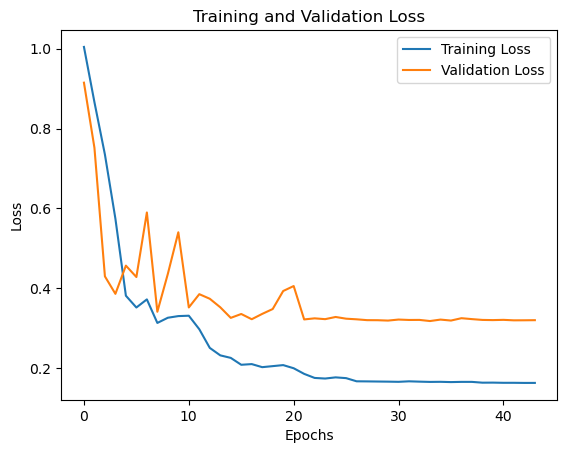

In [ ]:
#4)Learning Curves
#1)loss

plt.plot(history_ann.history['loss'], label='Training Loss')
plt.plot(history_ann.history['val_loss'], label='Validation Loss')

plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

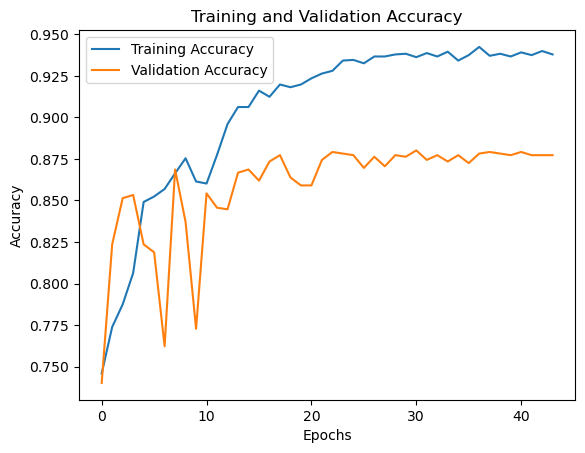

In [ ]:
# 2)Accuracy

plt.plot(history_ann.history['acc'], label='Training Accuracy')
plt.plot(history_ann.history['val_acc'], label='Validation Accuracy')

plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

In [ ]:
#model training (CNN)
#A)Build and compile the model

def load_model():
    model=Sequential([
        Conv2D(8, (3,3), padding='same', input_shape=(299,299, 3), activation='relu'),
        MaxPooling2D(pool_size=(3,3)),
        Conv2D(16, (3,3), padding='same', activation='relu'),
        MaxPooling2D(pool_size=(3,3)),
        Conv2D(32, (3,3), padding='same',  activation='relu'),
        MaxPooling2D(pool_size=(3,3)),

        Flatten(),
        Dense(128, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])

    model.compile(
    optimizer=Adam(learning_rate=0.0005),
        loss='categorical_crossentropy',
        metrics=['acc']
    )
    return model

In [ ]:
# B)Prune to the Overfit

early_stopping = callbacks.EarlyStopping(
    patience=10,
    min_delta=0,
    monitor='val_loss',
    restore_best_weights=True,
    verbose=0,
    mode='min',
    baseline=None,
)

In [ ]:
# This callback is used to reduce the learning rate when a metric has stopped improving
plateau = callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=4,
    verbose=0,
    mode='min'
)

In [ ]:
# 3)Model Training

nn_model = load_model()
historyy = nn_model.fit(X_train, Y_train, validation_data=(X_test, Y_test),
                        epochs=100,
                        callbacks=[early_stopping, plateau])

Epoch 1/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - acc: 0.6223 - loss: 0.8158 - val_acc: 0.8332 - val_loss: 0.4442 - learning_rate: 5.0000e-04
Epoch 2/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - acc: 0.8345 - loss: 0.4488 - val_acc: 0.8351 - val_loss: 0.4264 - learning_rate: 5.0000e-04
Epoch 3/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - acc: 0.8413 - loss: 0.4094 - val_acc: 0.8610 - val_loss: 0.3556 - learning_rate: 5.0000e-04
Epoch 4/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - acc: 0.8569 - loss: 0.3629 - val_acc: 0.8543 - val_loss: 0.3822 - learning_rate: 5.0000e-04
Epoch 5/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step - acc: 0.8851 - loss: 0.3159 - val_acc: 0.8677 - val_loss: 0.3215 - learning_rate: 5.0000e-04
Epoch 6/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - acc: 0.8872 - loss: 0.2699 - val_acc: 0.8408 - val_loss: 0.3717 - learning_rate: 5.0000e-04
Epoch 7/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - acc: 0.8975 - loss: 0.2739 - val_acc: 0.8562 - val_loss: 0.3361 - lear

In [ ]:
#5)Model Accuracy

loss,acc=nn_model.evaluate(X_test,Y_test)

33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - acc: 0.8857 - loss: 0.3154


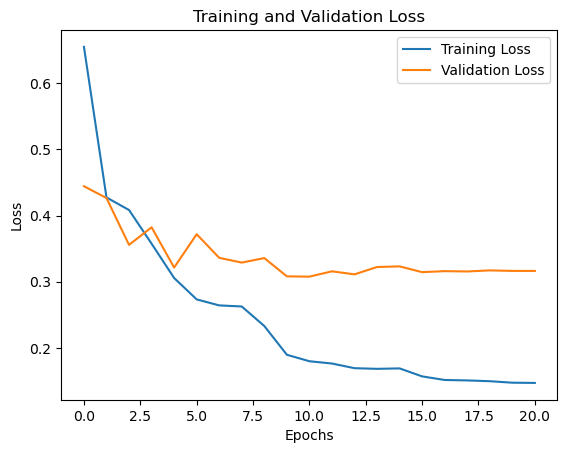

In [ ]:
# 6)Learning Curve
# Loss

plt.plot(historyy.history['loss'], label='Training Loss')
plt.plot(historyy.history['val_loss'], label='Validation Loss')

plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

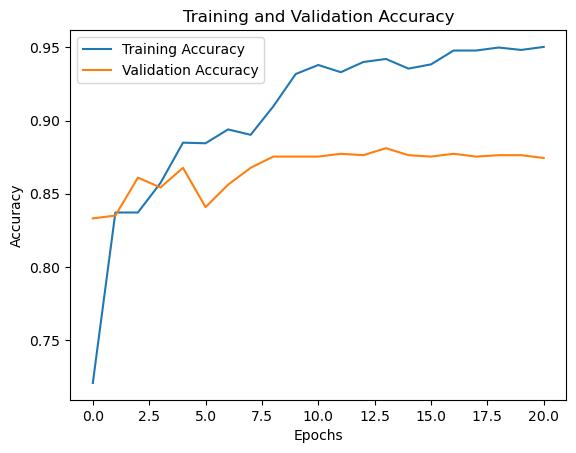

In [ ]:
#Accuracy

plt.plot(historyy.history['acc'], label='Training Accuracy')
plt.plot(historyy.history['val_acc'], label='Validation Accuracy')

plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

In [ ]:
nn_model.save('Lung_Disease.h5')

In [ ]:
y_pred=nn_model.predict(X_test)

33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step


In [ ]:
y_predicted_labels=[np.argmax(i) for i in y_pred]

In [ ]:
y_predicted_labels=np.array(y_predicted_labels)

In [ ]:
y_predicted_labels.shape

(1043,)

In [ ]:
y_predicted_labels

array([0, 0, 1, ..., 0, 2, 1], dtype=int64)

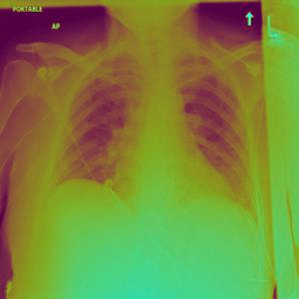

In [ ]:
#prediction Function
#First Example

img=array_to_img(X_test[14])
img

In [ ]:
#Finding the Max value from prediction list and comparing original values vs predicted

labels=lb.classes_
print(labels)

print('Originally: ', labels[np.argmax(Y_test[14])])
print('Predicted: ', labels[np.argmax(y_pred[14])])

['Lung_Opacity' 'Normal' 'Viral Pneumonia']
Originally:  Lung_Opacity
Predicted:  Lung_Opacity


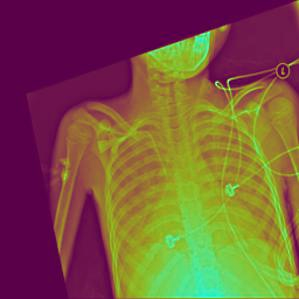

In [ ]:
#Second Example

img=array_to_img(X_test[43])
img

In [ ]:
labels=lb.classes_
print(labels)

print('Originally: ', labels[np.argmax(Y_test[43])])
print('Predicted: ', labels[np.argmax(y_pred[43])])


['Lung_Opacity' 'Normal' 'Viral Pneumonia']
Originally:  Lung_Opacity
Predicted:  Normal


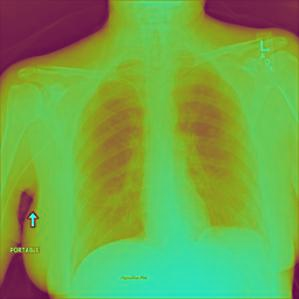

In [ ]:
img=array_to_img(X_test[200])
img

In [ ]:
labels=lb.classes_
print(labels)

print('Originally: ', labels[np.argmax(Y_test[200])])
print('Predicted: ', labels[np.argmax(y_pred[200])])

['Lung_Opacity' 'Normal' 'Viral Pneumonia']
Originally:  Normal
Predicted:  Normal


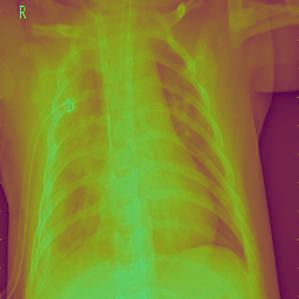

In [ ]:
img=array_to_img(X_test[700])
img

In [ ]:
labels=lb.classes_
print(labels)

print('Originally: ', labels[np.argmax(Y_test[700])])
print('Predicted: ', labels[np.argmax(y_pred[700])])

['Lung_Opacity' 'Normal' 'Viral Pneumonia']
Originally:  Viral Pneumonia
Predicted:  Viral Pneumonia


In [ ]:
from sklearn.metrics import mean_absolute_error
meanR=mean_absolute_error(Y_test,y_pred)
meanR

0.10767491734266299

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
perR=mean_absolute_percentage_error(Y_test,y_pred)
perR

242462359671585.0

In [ ]:
from sklearn.metrics import mean_squared_error
sqrR=mean_squared_error(Y_test,y_pred)
sqrR

0.06025188788395284

In [ ]:
from sklearn.metrics import r2_score
r2R=r2_score(Y_test,y_pred)
r2R

0.7331734546367713